### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku ([`cv2.threshold`](https://docs.opencv.org/3.4/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57) odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [1]:
import cv2
import numpy as np
from PIL import Image

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania.  
W jaki sposób ustalisz wartość progu? Jak wartość progu wpływa na wyniki?  
Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

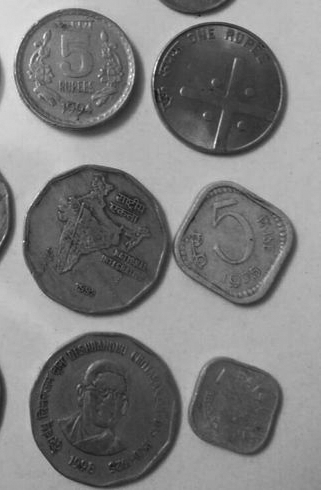

In [2]:
# 1A
monety_szare = cv2.imread('../dane1-4/Monety_szare.bmp')
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

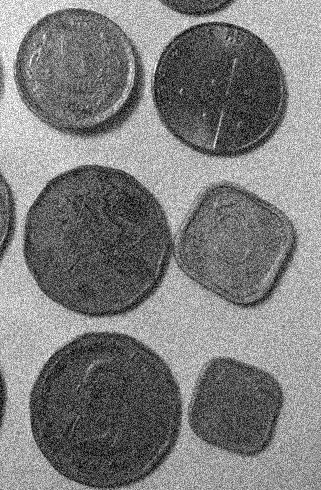

In [3]:
# 1B
monety_szare_szum = cv2.imread('../dane1-4/Monety_szare_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

In [4]:
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider

Rozwiązanie części 1A:

In [5]:
def anim_plot(image, T_init = 130):
    _, img_threshInv = cv2.threshold(image, T_init, 255, cv2.THRESH_BINARY_INV)
    binary_img = Image.fromarray(img_threshInv)
    
    fig, axs = plt.subplots(1, 3, figsize = (11, 3), gridspec_kw = {'width_ratios': [1, 1, 2]})
    axs[0].imshow(image, cmap = 'gray')
    axs[0].set_title('Obraz oryginalny')
    axs[1].imshow(binary_img, cmap = 'gray')
    axs[1].set_title('Obraz binarny')
    axs[2].hist(image.flatten(), bins = 255, color = 'gray')
    axs[2].axvline(x = T_init, color = 'red', linestyle = '--', linewidth = 2)
    axs[2].set_title('Histogram szarości')

    T_axis = plt.axes([0.15, 0, 0.65, 0.03], facecolor = 'lightgoldenrodyellow')
    slider = Slider(T_axis, 'T', 0, 250, valinit = T_init, valstep = 1)

    def update(val):
        T = int(slider.val)
        _, img_threshInv = cv2.threshold(image, T, 255, cv2.THRESH_BINARY_INV)
        binary_img = Image.fromarray(img_threshInv)
        
        axs[1].clear()
        axs[1].imshow(binary_img, cmap = 'gray')
        axs[1].set_title('Obraz binarny')
        axs[2].clear()
        axs[2].hist(image.flatten(), bins = 255, color = 'gray')
        axs[2].axvline(x = T, color = 'red', linestyle = '--', linewidth = 2)
        axs[2].set_title('Histogram szarości')

        fig.canvas.draw_idle()

    slider.on_changed(update)

    plt.show()

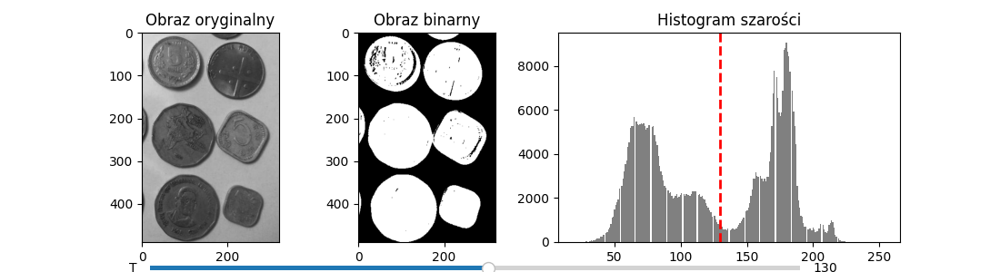

In [197]:
%matplotlib widget
anim_plot(monety_szare)

Rozwiązanie części 1B:


#### BRAK FILTRA

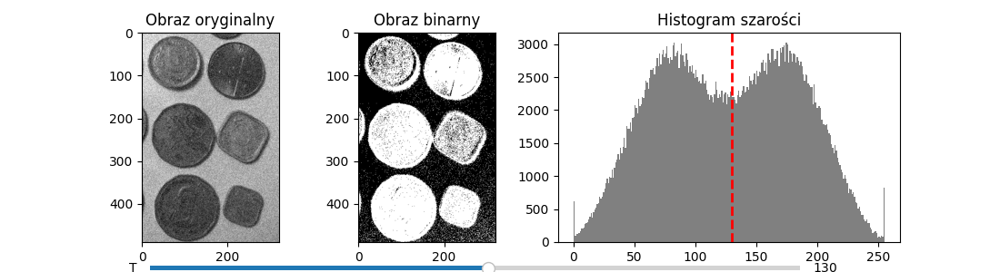

In [7]:
anim_plot(monety_szare_szum)

#### FILTR UŚREDNIAJĄCY 3X3

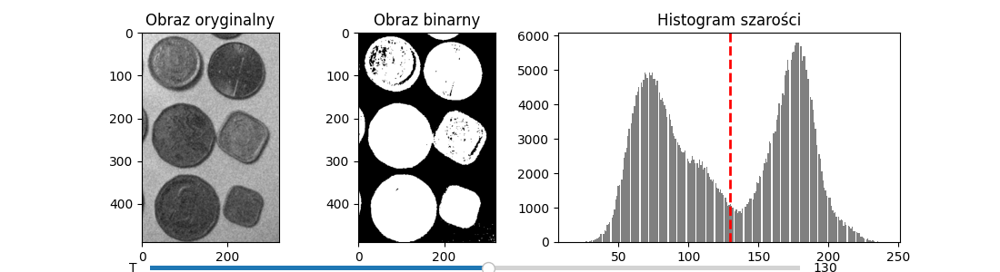

In [8]:
kernel_blur = np.ones((3, 3), np.float32) / 9
monety_szare_filtr1 = cv2.filter2D(src = monety_szare_szum, ddepth = -1, kernel = kernel_blur)
anim_plot(monety_szare_filtr1)

#### FILTR UŚREDNIAJĄCY 5X5

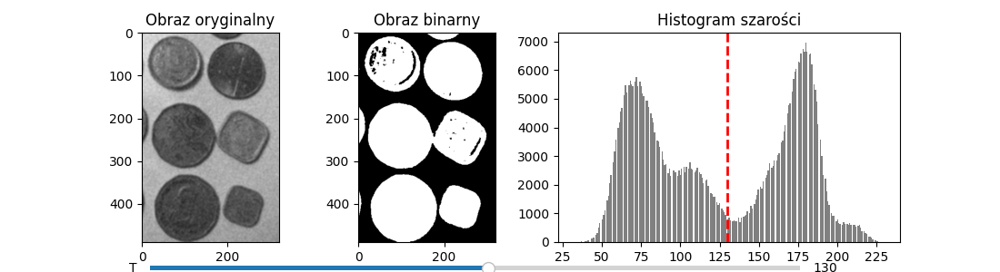

In [9]:
kernel_blur = np.ones((5, 5), np.float32) / 25
monety_szare_filtr2 = cv2.filter2D(src = monety_szare_szum, ddepth = -1, kernel = kernel_blur)
anim_plot(monety_szare_filtr2)

#### FILTR UŚREDNIAJĄCY 3X3 (2 NA ŚRODKU)

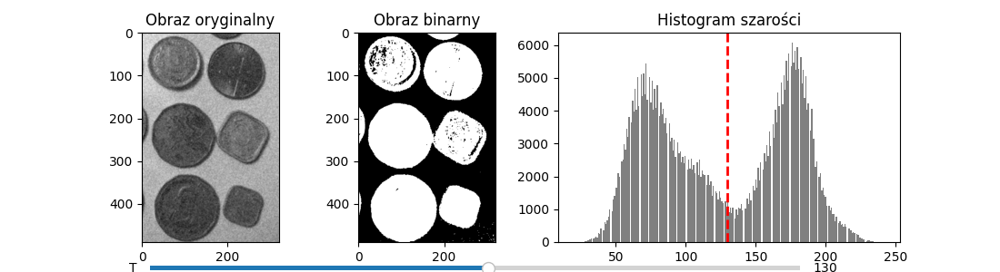

In [10]:
kernel_blur = np.array([[1, 1, 1], 
                        [1, 2, 1], 
                        [1, 1, 1]])/10
monety_szare_filtr3 = cv2.filter2D(src = monety_szare_szum, ddepth = -1, kernel = kernel_blur)
anim_plot(monety_szare_filtr3)

#### FILTR GAUSSA 3X3

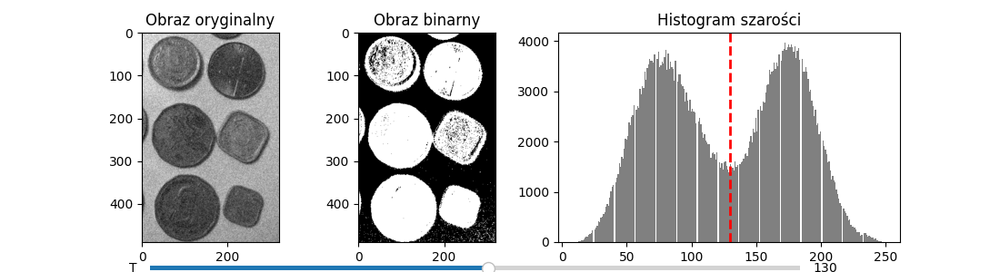

In [11]:
kernel_blur = np.array([[1, 4, 1], 
                        [4, 32, 4], 
                        [1, 4, 1]]) / 52
monety_szare_filtr4 = cv2.filter2D(src = monety_szare_szum, ddepth = -1, kernel = kernel_blur)
anim_plot(monety_szare_filtr4)

#### FILTR GAUSSA 5X5

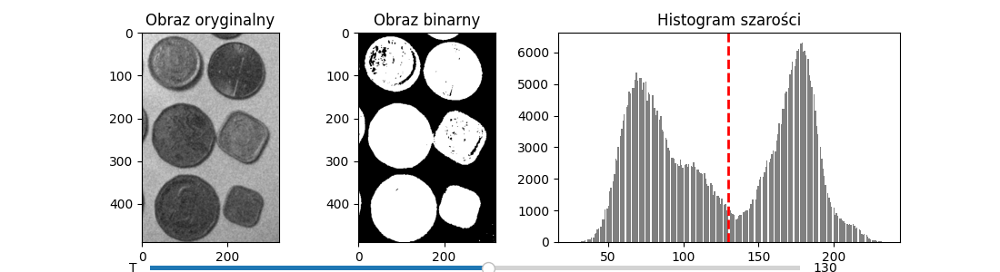

In [12]:
kernel_blur = np.array([[1, 3, 4, 3, 1], 
                        [3, 12, 19, 12, 3], 
                        [4, 19, 32, 19, 4],
                        [3, 12, 19, 12, 3],
                        [1, 3, 4, 3, 1]]) / 200
monety_szare_filtr5 = cv2.filter2D(src = monety_szare_szum, ddepth = -1, kernel = kernel_blur)
anim_plot(monety_szare_filtr5)

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Uzasadnij dobór progu w oparciu o histogram wybranej składowej.

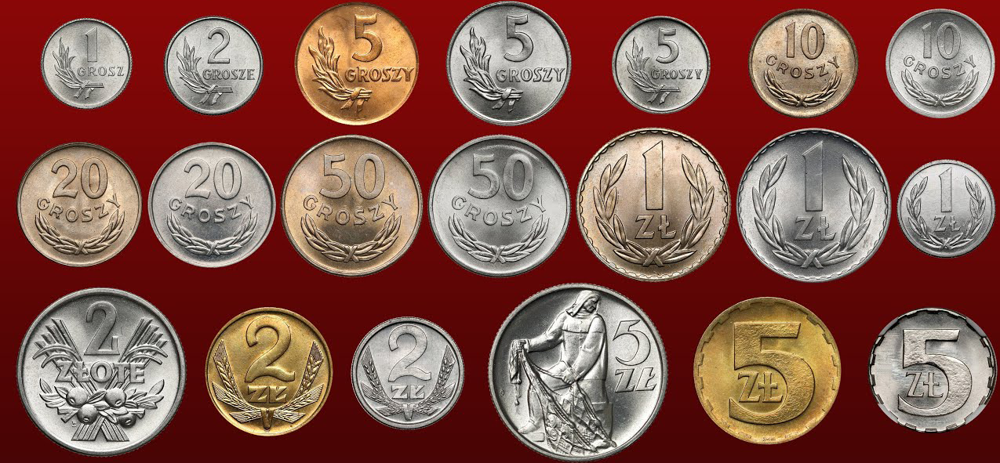

In [13]:
# 2A
monety_kolor = cv2.imread('../dane1-4/Monety_kolor.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

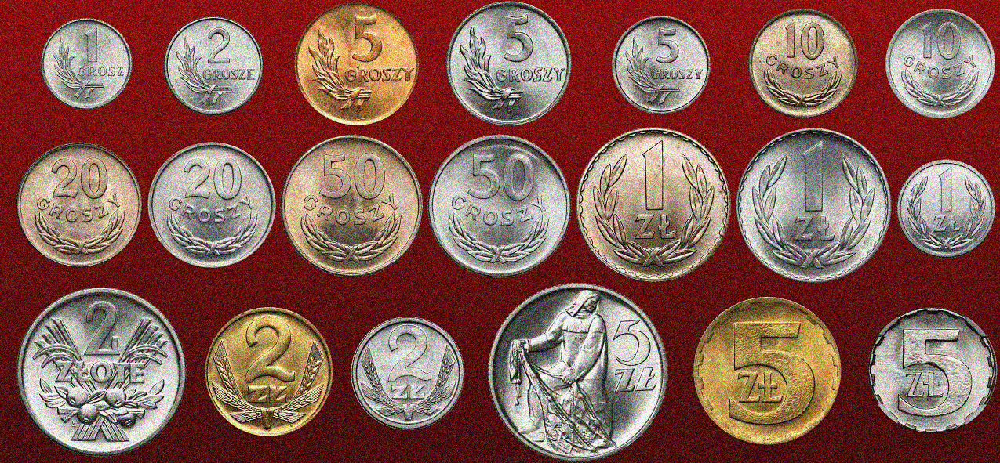

In [14]:
# 2B
monety_kolor_szum = cv2.imread('../dane1-4/Monety_kolor_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 2A:

In [15]:
from typing import Literal

def anim_plot_color(image, *, level: Literal['h', 's', 'v']):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv_image)
    fig, axs = plt.subplots(1, 3, figsize = (12, 2.2), gridspec_kw = {'width_ratios': [1, 1, 2]})
    axs[0].imshow(cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB))
    axs[0].set_title('Obraz oryginalny')
    axs[0].axis('off')
    T_axis = plt.axes([0.15, 0.05, 0.65, 0.03], facecolor = 'lightgoldenrodyellow')
    
    if level == 'h':
        _, binary = cv2.threshold(h, 90, 180, cv2.THRESH_BINARY_INV)
        binary_img = Image.fromarray(binary)
        axs[1].imshow(binary_img, cmap = 'gray')
        axs[1].set_title('Obraz binarny')
        axs[1].axis('off')
        axs[2].hist(h.flatten(), bins = 255, color = 'gray')
        axs[2].axvline(x = 90, color = 'red', linestyle = '--', linewidth = 2)
        axs[2].set_title('Histogram odcienia (hue)')
        axs[2].set_xticks([])
        axs[2].yaxis.tick_right()
        slider = Slider(T_axis, 'T', 0, 180, valinit = 90, valstep = 10)
        
        def update(val):
            T = int(slider.val)
            _, binary = cv2.threshold(h, T, 180, cv2.THRESH_BINARY_INV)
            binary_img = Image.fromarray(binary)
            axs[1].clear()
            axs[1].imshow(binary_img, cmap = 'gray')
            axs[1].set_title('Obraz binarny')
            axs[1].axis('off')
            axs[2].clear()
            axs[2].hist(h.flatten(), bins = 180, color = 'gray')
            axs[2].axvline(x = T, color = 'red', linestyle = '--', linewidth = 2)
            axs[2].set_title('Histogram odcienia (hue)')
            axs[2].set_xticks([])
            axs[2].yaxis.tick_right()
            fig.canvas.draw_idle()
            
    elif level == 's':
        _, binary = cv2.threshold(s, 130, 255, cv2.THRESH_BINARY_INV)
        binary_img = Image.fromarray(binary)
        axs[1].imshow(binary_img, cmap = 'gray')
        axs[1].set_title('Obraz binarny')
        axs[1].axis('off')
        axs[2].hist(s.flatten(), bins = 255, color = 'gray')
        axs[2].axvline(x = 130, color = 'red', linestyle = '--', linewidth = 2)
        axs[2].set_title('Histogram nasycenia (saturation)')
        axs[2].set_xticks([])
        axs[2].yaxis.tick_right()
        slider = Slider(T_axis, 'T', 0, 250, valinit = 130, valstep = 10)
        
        def update(val):
            T = int(slider.val)
            _, binary = cv2.threshold(s, T, 255, cv2.THRESH_BINARY_INV)
            binary_img = Image.fromarray(binary)
            axs[1].clear()
            axs[1].imshow(binary_img, cmap = 'gray')
            axs[1].set_title('Obraz binarny')
            axs[1].axis('off')
            axs[2].clear()
            axs[2].hist(s.flatten(), bins = 255, color = 'gray')
            axs[2].axvline(x = T, color = 'red', linestyle = '--', linewidth = 2)
            axs[2].set_title('Histogram nasycenia (saturation)')
            axs[2].set_xticks([])
            axs[2].yaxis.tick_right()
            fig.canvas.draw_idle()
            
    elif level == 'v':
        _, binary = cv2.threshold(v, 130, 255, cv2.THRESH_BINARY_INV)
        binary_img = Image.fromarray(binary)
        axs[1].imshow(binary_img, cmap = 'gray')
        axs[1].set_title('Obraz binarny')
        axs[1].axis('off')
        axs[2].hist(v.flatten(), bins = 255, color = 'gray')
        axs[2].axvline(x = 130, color = 'red', linestyle = '--', linewidth = 2)
        axs[2].set_title('Histogram jasności (value)')
        axs[2].set_xticks([])
        axs[2].yaxis.tick_right()
        slider = Slider(T_axis, 'T', 0, 250, valinit = 130, valstep = 10)
        
        def update(val):
            T = int(slider.val)
            _, binary = cv2.threshold(v, T, 180, cv2.THRESH_BINARY_INV)
            binary_img = Image.fromarray(binary)
            axs[1].clear()
            axs[1].imshow(binary_img, cmap = 'gray')
            axs[1].set_title('Obraz binarny')
            axs[1].axis('off')
            axs[2].clear()
            axs[2].hist(v.flatten(), bins = 255, color = 'gray')
            axs[2].axvline(x = T, color = 'red', linestyle = '--', linewidth = 2)
            axs[2].set_title('Histogram jasności (value)')
            axs[2].set_xticks([])
            axs[2].yaxis.tick_right()
            fig.canvas.draw_idle()

    slider.on_changed(update)
    plt.show()

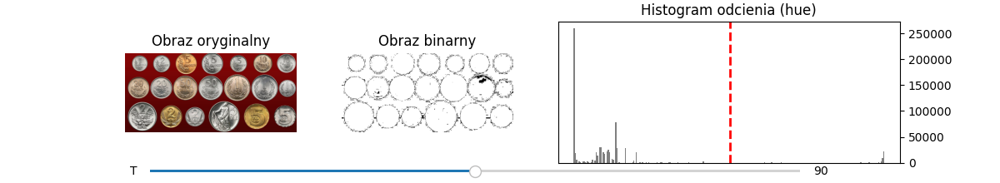

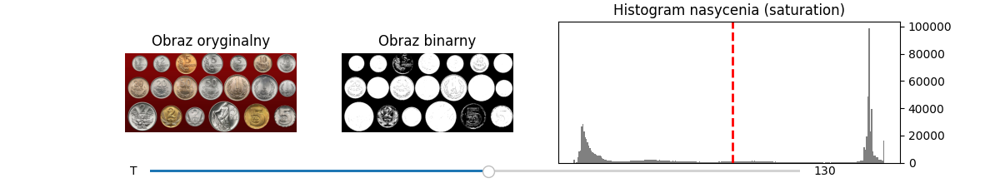

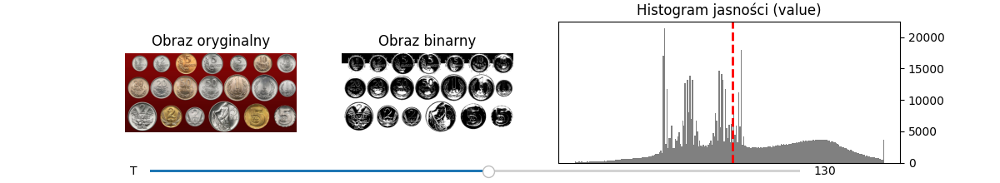

In [26]:
anim_plot_color(monety_kolor, level = 'h')
anim_plot_color(monety_kolor, level = 's')
anim_plot_color(monety_kolor, level = 'v')

Rozwiązanie części 2B:


#### BRAK FILTRA

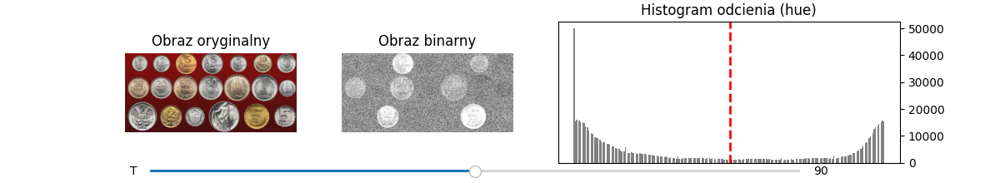

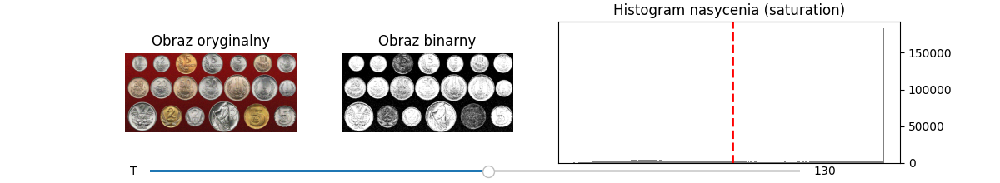

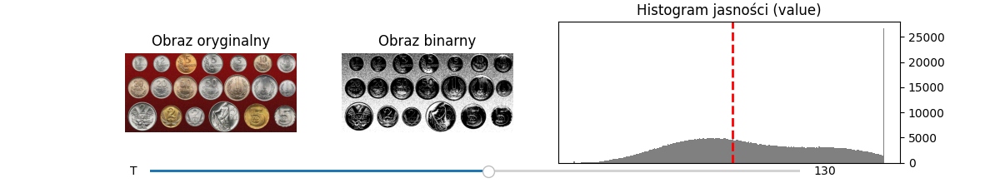

In [17]:
anim_plot_color(monety_kolor_szum, level = 'h')
anim_plot_color(monety_kolor_szum, level = 's')
anim_plot_color(monety_kolor_szum, level = 'v')

#### FILTR UŚREDNIAJĄCY 3X3

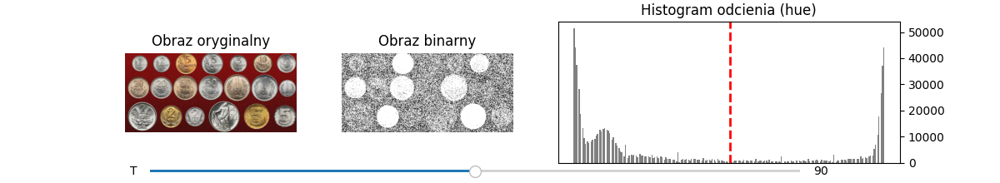

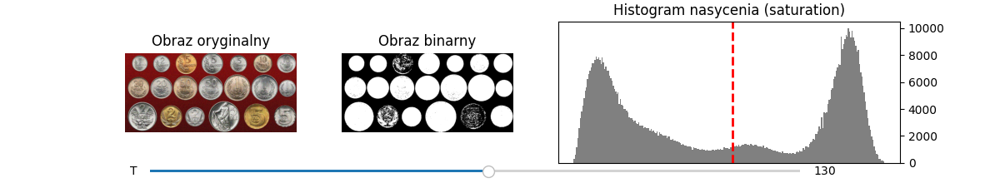

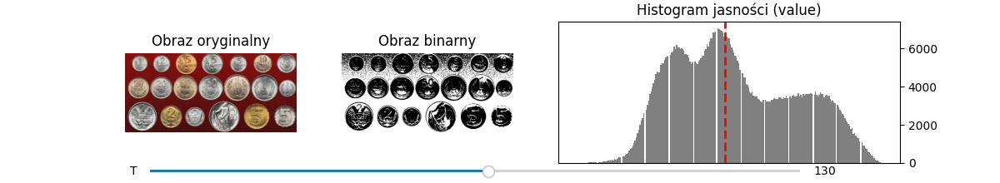

In [24]:
kernel_blur = np.ones((3, 3), np.float32) / 9
monety_kolor_filtr1 = cv2.filter2D(src = monety_kolor_szum, ddepth = -1, kernel = kernel_blur)
anim_plot_color(monety_kolor_filtr1, level = 'h')
anim_plot_color(monety_kolor_filtr1, level = 's')
anim_plot_color(monety_kolor_filtr1, level = 'v')

#### FILTR UŚREDNIAJĄCY 5X5

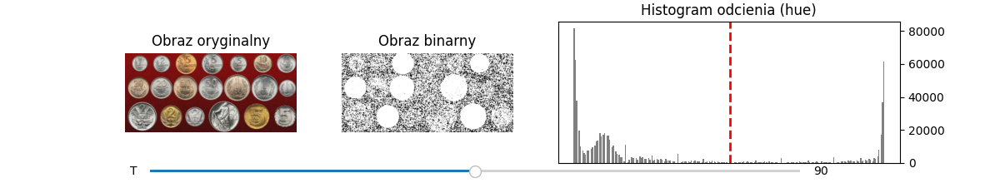

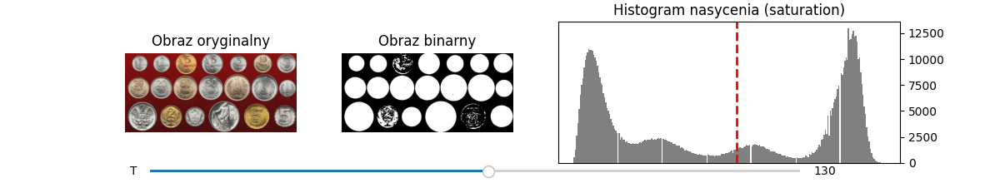

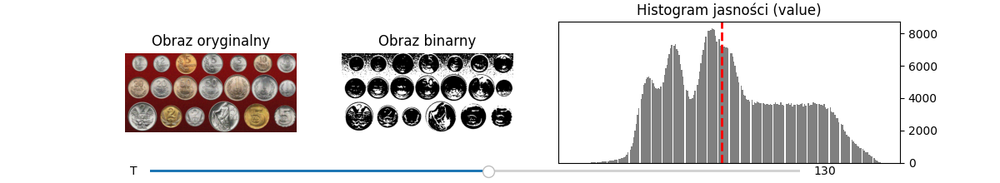

In [19]:
kernel_blur = np.ones((5, 5), np.float32) / 25
monety_kolor_filtr2 = cv2.filter2D(src = monety_kolor_szum, ddepth = -1, kernel = kernel_blur)
anim_plot_color(monety_kolor_filtr2, level = 'h')
anim_plot_color(monety_kolor_filtr2, level = 's')
anim_plot_color(monety_kolor_filtr2, level = 'v')

#### FILTR GAUSSA 5X5

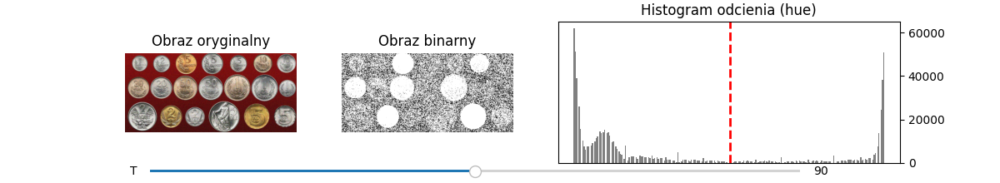

C:\Users\20meh\AppData\Local\Temp\ipykernel_24948\287160006.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 3, figsize = (12, 2.2), gridspec_kw = {'width_ratios': [1, 1, 2]})


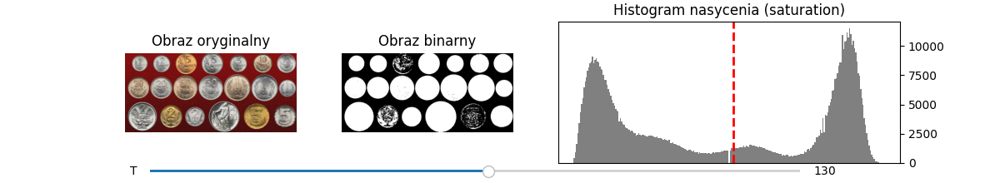

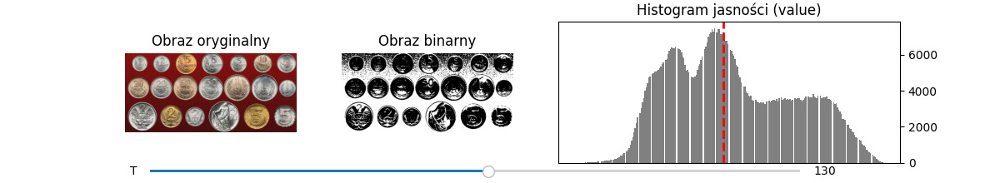

In [20]:
monety_kolor_filtr3 = cv2.GaussianBlur(monety_kolor_szum, (5, 5), sigmaX = 0)
anim_plot_color(monety_kolor_filtr3, level = 'h')
anim_plot_color(monety_kolor_filtr3, level = 's')
anim_plot_color(monety_kolor_filtr3, level = 'v')

##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

_(Pełna punktacja za zadanie wymaga własnoręcznej implementacji okna przesuwnego i filtracji wewnątrz niego. Użycie zamiast tego_ `cv2.adaptiveThreshold` _liczone jako pół zadania, przy założeniu zrozumienia tej metody.)_

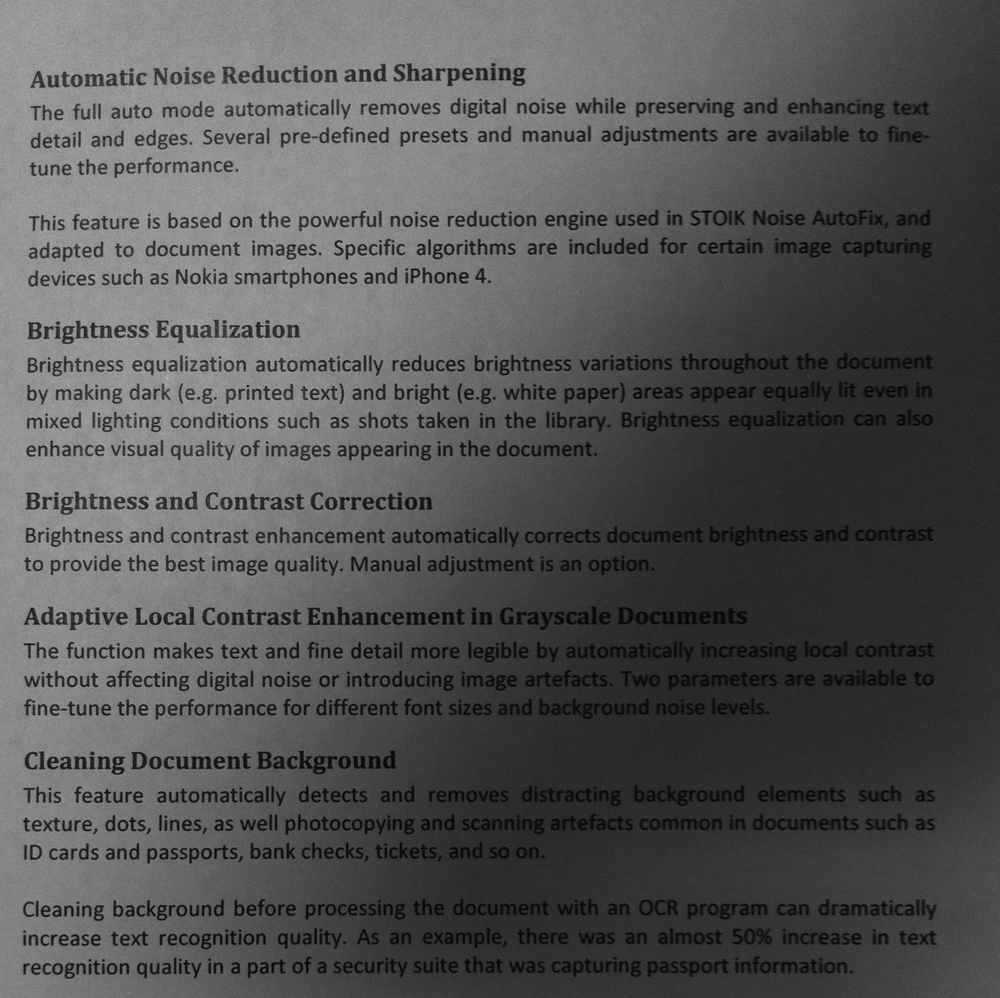

In [21]:
tekst = cv2.imread('../dane1-4/Tekst1.bmp')
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

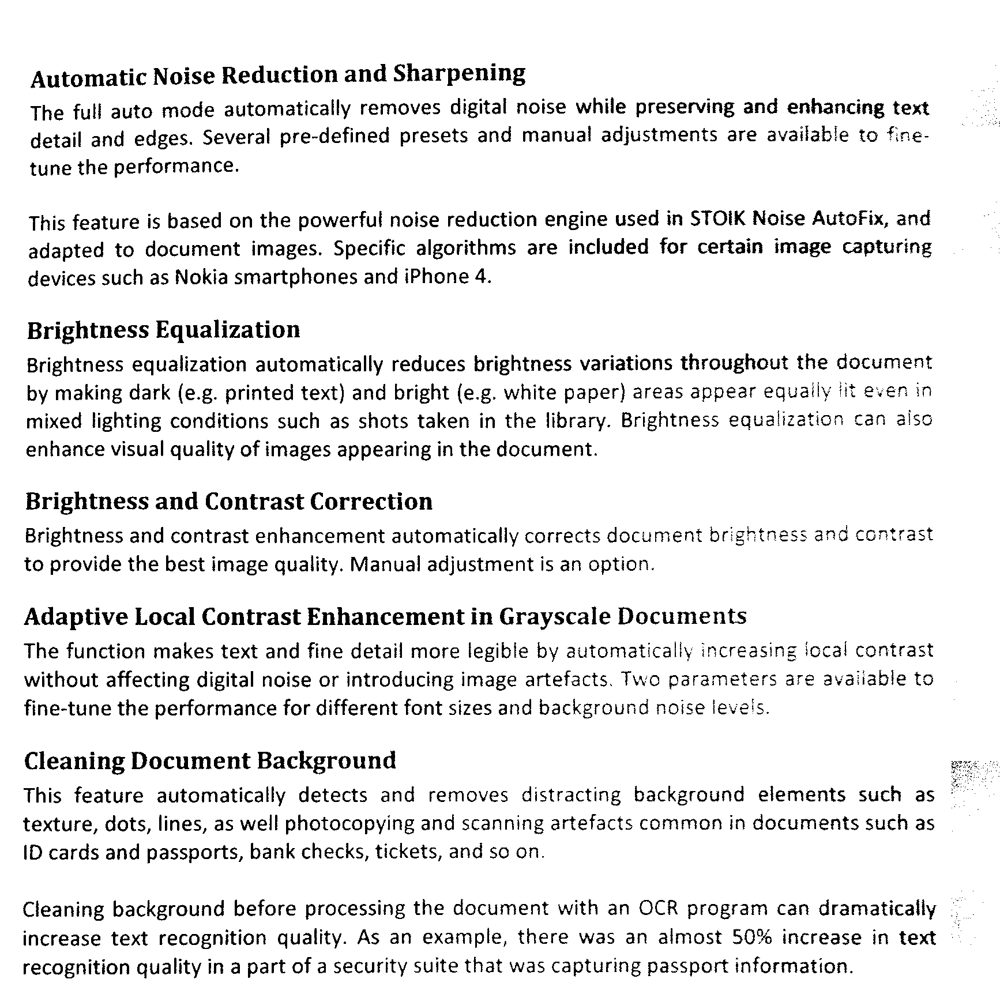

In [209]:
def window_binarization(img, window_height, window_width, sensitivity = 14):
    img_height, img_width = img.shape

    for row in range(0, img_height // window_height + 1):
        row_i = row * window_height
        if row == img_height // window_height:
            row_j = img_height
        else:
            row_j = (row + 1) * window_height
            
        for col in range(0, img_width // window_width + 1):
            col_i = col * window_width
            if col == img_width // window_width:
                col_j = img_width
            else:
                col_j = (col + 1) * window_width

            window = img[row_i : row_j, col_i : col_j]
            T, _ = cv2.threshold(window, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            adjusted_T = T - sensitivity
            
            _, binary_img = cv2.threshold(window, adjusted_T, 255, cv2.THRESH_BINARY)
            img[row_i : row_j, col_i : col_j] = binary_img
            
    return img


tekst_szary = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)
img = window_binarization(tekst_szary, 220, 110)   
Image.fromarray(img)